# YOLOv12 Traffic Detection - Training Notebook

**Dataset:** traffic-merged v2 (traffic day night)  
**Source:** Roboflow Universe  
**Format:** YOLOv12  
**Classes:** `big-vehicle`, `car`, `pedestrian`, `two-wheeler`

---

## Notebook Structure
1. **Setup & Configuration**
2. **Exploratory Data Analysis (EDA)**
3. **Model Training**
4. **Evaluation & Results**

---
## 1. Setup & Configuration

In [22]:
# =============================================
# LIBRARY IMPORTS
# =============================================
import os
import yaml
import random
from pathlib import Path
from collections import Counter

import cv2
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from PIL import Image

# YOLO Training
from ultralytics import YOLO
from ultralytics import settings

# GPU/CUDA check
import torch

settings.update({'sync': False})
# Set style
plt.style.use('seaborn-v0_8-whitegrid')
sns.set_palette('viridis')

print("Libraries loaded successfully!")

Libraries loaded successfully!


In [23]:
# =============================================
# GPU VERIFICATION (NVIDIA CUDA)
# =============================================

print("=== GPU Information ===")
print(f"PyTorch Version: {torch.__version__}")
print(f"CUDA Available: {torch.cuda.is_available()}")

if torch.cuda.is_available():
    print(f"CUDA Version: {torch.version.cuda}")
    print(f"GPU Count: {torch.cuda.device_count()}")
    print(f"GPU Name: {torch.cuda.get_device_name(0)}")
    print(f"GPU Memory: {torch.cuda.get_device_properties(0).total_memory / 1024**3:.1f} GB")
    DEVICE = 0  # Use first NVIDIA GPU
    print(f"\n[OK] Training will use GPU: {torch.cuda.get_device_name(0)}")
else:
    print("\n[WARNING] No GPU detected! Training will be SLOW on CPU.")
    print("Please ensure NVIDIA drivers and CUDA are properly installed.")
    DEVICE = 'cpu'

=== GPU Information ===
PyTorch Version: 2.5.1+cu121
CUDA Available: True
CUDA Version: 12.1
GPU Count: 1
GPU Name: NVIDIA GeForce RTX 4060 Ti
GPU Memory: 8.0 GB

[OK] Training will use GPU: NVIDIA GeForce RTX 4060 Ti


In [24]:
# =============================================
# DATASET CONFIGURATION
# =============================================

# Path ke dataset (sesuaikan dengan lokasi Anda)
DATASET_ROOT: str = "traffic-merged.v2-traffic-day-night.yolov12"
DATA_YAML: str = os.path.join(DATASET_ROOT, "data.yaml")

# Load data.yaml
with open(DATA_YAML, 'r') as f:
    data_config: dict = yaml.safe_load(f)

# Extract info
NUM_CLASSES: int = data_config['nc']
CLASS_NAMES: list[str] = data_config['names']

print(f"Dataset Root: {DATASET_ROOT}")
print(f"Number of Classes: {NUM_CLASSES}")
print(f"Class Names: {CLASS_NAMES}")

Dataset Root: traffic-merged.v2-traffic-day-night.yolov12
Number of Classes: 4
Class Names: ['big-vehicle', 'car', 'pedestrian', 'two-wheeler']


In [25]:
# =============================================
# DATASET PATHS
# =============================================

# Define paths
TRAIN_IMG_DIR: Path = Path(DATASET_ROOT) / "train" / "images"
TRAIN_LBL_DIR: Path = Path(DATASET_ROOT) / "train" / "labels"

VALID_IMG_DIR: Path = Path(DATASET_ROOT) / "valid" / "images"
VALID_LBL_DIR: Path = Path(DATASET_ROOT) / "valid" / "labels"

TEST_IMG_DIR: Path = Path(DATASET_ROOT) / "test" / "images"
TEST_LBL_DIR: Path = Path(DATASET_ROOT) / "test" / "labels"

# Count files
train_images: list = list(TRAIN_IMG_DIR.glob("*.jpg"))
valid_images: list = list(VALID_IMG_DIR.glob("*.jpg"))
test_images: list = list(TEST_IMG_DIR.glob("*.jpg"))

train_labels: list = list(TRAIN_LBL_DIR.glob("*.txt"))
valid_labels: list = list(VALID_LBL_DIR.glob("*.txt"))
test_labels: list = list(TEST_LBL_DIR.glob("*.txt"))

print("\n=== Dataset Split Summary ===")
print(f"Training:   {len(train_images):,} images | {len(train_labels):,} labels")
print(f"Validation: {len(valid_images):,} images | {len(valid_labels):,} labels")
print(f"Test:       {len(test_images):,} images | {len(test_labels):,} labels")
print(f"Total:      {len(train_images) + len(valid_images) + len(test_images):,} images")


=== Dataset Split Summary ===
Training:   8,429 images | 8,429 labels
Validation: 427 images | 427 labels
Test:       136 images | 136 labels
Total:      8,992 images


---
## 2. Exploratory Data Analysis (EDA)

### 2.1 Dataset Split Visualization

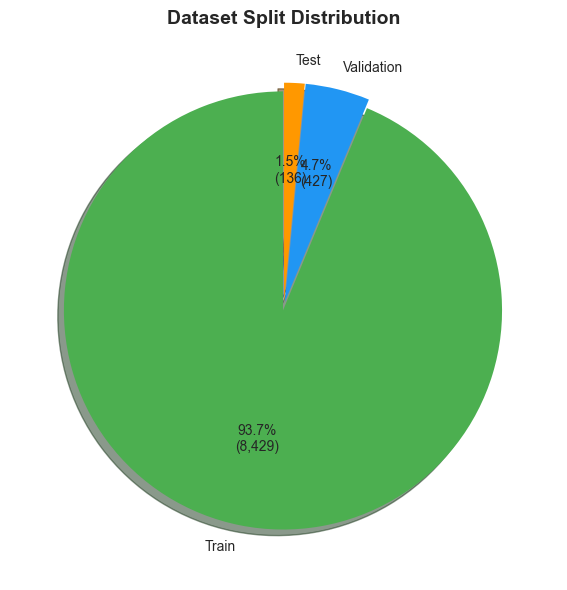

In [26]:
# =============================================
# DATASET SPLIT PIE CHART
# =============================================

split_counts: list[int] = [len(train_images), len(valid_images), len(test_images)]
split_labels: list[str] = ['Train', 'Validation', 'Test']
colors: list[str] = ['#4CAF50', '#2196F3', '#FF9800']

fig, ax = plt.subplots(figsize=(8, 6))
wedges, texts, autotexts = ax.pie(
    split_counts,
    labels=split_labels,
    autopct=lambda p: f'{p:.1f}%\n({int(p * sum(split_counts) / 100):,})',
    colors=colors,
    explode=(0.02, 0.02, 0.02),
    shadow=True,
    startangle=90
)
ax.set_title('Dataset Split Distribution', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

### 2.2 Class Distribution Analysis

In [27]:
# =============================================
# COUNT ANNOTATIONS PER CLASS
# =============================================

def count_class_distribution(label_dir: Path) -> Counter:
    """Count annotations per class from YOLO label files."""
    class_counter: Counter = Counter()
    
    for label_file in label_dir.glob("*.txt"):
        with open(label_file, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if parts:
                    class_id: int = int(parts[0])
                    class_counter[class_id] += 1
    
    return class_counter

# Count for all splits
train_class_dist: Counter = count_class_distribution(TRAIN_LBL_DIR)
valid_class_dist: Counter = count_class_distribution(VALID_LBL_DIR)
test_class_dist: Counter = count_class_distribution(TEST_LBL_DIR)

# Total distribution
total_class_dist: Counter = train_class_dist + valid_class_dist + test_class_dist

print("\n=== Class Distribution (Total) ===")
for class_id, count in sorted(total_class_dist.items()):
    class_name: str = CLASS_NAMES[class_id] if class_id < len(CLASS_NAMES) else f"Unknown-{class_id}"
    print(f"  [{class_id}] {class_name}: {count:,} annotations")

print(f"\nTotal Annotations: {sum(total_class_dist.values()):,}")


=== Class Distribution (Total) ===
  [0] big-vehicle: 6,893 annotations
  [1] car: 14,804 annotations
  [2] pedestrian: 19,782 annotations
  [3] two-wheeler: 20,664 annotations

Total Annotations: 62,143


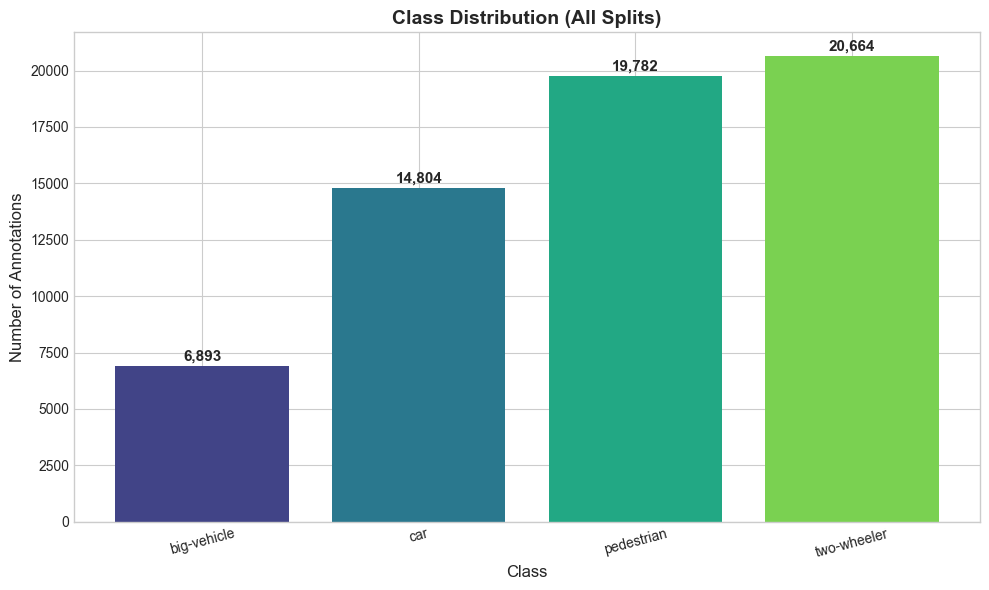

In [28]:
# =============================================
# CLASS DISTRIBUTION BAR CHART
# =============================================

fig, ax = plt.subplots(figsize=(10, 6))

class_ids: list[int] = sorted(total_class_dist.keys())
class_labels: list[str] = [CLASS_NAMES[i] if i < len(CLASS_NAMES) else f"Class-{i}" for i in class_ids]
counts: list[int] = [total_class_dist[i] for i in class_ids]

bars = ax.bar(class_labels, counts, color=sns.color_palette('viridis', len(class_ids)))

# Add value labels on bars
for bar, count in zip(bars, counts):
    ax.text(
        bar.get_x() + bar.get_width() / 2,
        bar.get_height() + 100,
        f'{count:,}',
        ha='center', va='bottom', fontsize=11, fontweight='bold'
    )

ax.set_xlabel('Class', fontsize=12)
ax.set_ylabel('Number of Annotations', fontsize=12)
ax.set_title('Class Distribution (All Splits)', fontsize=14, fontweight='bold')
plt.xticks(rotation=15)
plt.tight_layout()
plt.show()

### 2.3 Bounding Box Size Analysis

In [29]:
# =============================================
# BOUNDING BOX SIZE ANALYSIS
# =============================================

def get_bbox_sizes(label_dir: Path, img_size: int = 640) -> dict[int, list[tuple[float, float]]]:
    """Extract bounding box widths and heights per class (in pixels)."""
    bbox_sizes: dict[int, list[tuple[float, float]]] = {i: [] for i in range(NUM_CLASSES)}
    
    for label_file in label_dir.glob("*.txt"):
        with open(label_file, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) >= 5:
                    class_id: int = int(parts[0])
                    w_norm: float = float(parts[3])
                    h_norm: float = float(parts[4])
                    
                    # Convert to pixels
                    w_px: float = w_norm * img_size
                    h_px: float = h_norm * img_size
                    
                    if class_id < NUM_CLASSES:
                        bbox_sizes[class_id].append((w_px, h_px))
    
    return bbox_sizes

# Get bbox sizes from training set
train_bbox_sizes: dict = get_bbox_sizes(TRAIN_LBL_DIR)

print("\n=== Bounding Box Size Statistics (Training Set) ===")
for class_id in range(NUM_CLASSES):
    if train_bbox_sizes[class_id]:
        widths = [s[0] for s in train_bbox_sizes[class_id]]
        heights = [s[1] for s in train_bbox_sizes[class_id]]
        print(f"\n[{CLASS_NAMES[class_id]}]")
        print(f"  Width  - Mean: {np.mean(widths):.1f}px, Median: {np.median(widths):.1f}px, Std: {np.std(widths):.1f}px")
        print(f"  Height - Mean: {np.mean(heights):.1f}px, Median: {np.median(heights):.1f}px, Std: {np.std(heights):.1f}px")


=== Bounding Box Size Statistics (Training Set) ===

[big-vehicle]
  Width  - Mean: 307.3px, Median: 341.0px, Std: 205.5px
  Height - Mean: 320.1px, Median: 327.0px, Std: 186.5px

[car]
  Width  - Mean: 63.5px, Median: 48.0px, Std: 48.8px
  Height - Mean: 85.8px, Median: 67.0px, Std: 59.4px

[pedestrian]
  Width  - Mean: 26.3px, Median: 23.0px, Std: 15.0px
  Height - Mean: 113.8px, Median: 96.0px, Std: 64.5px

[two-wheeler]
  Width  - Mean: 32.2px, Median: 26.5px, Std: 21.2px
  Height - Mean: 88.0px, Median: 74.5px, Std: 50.2px


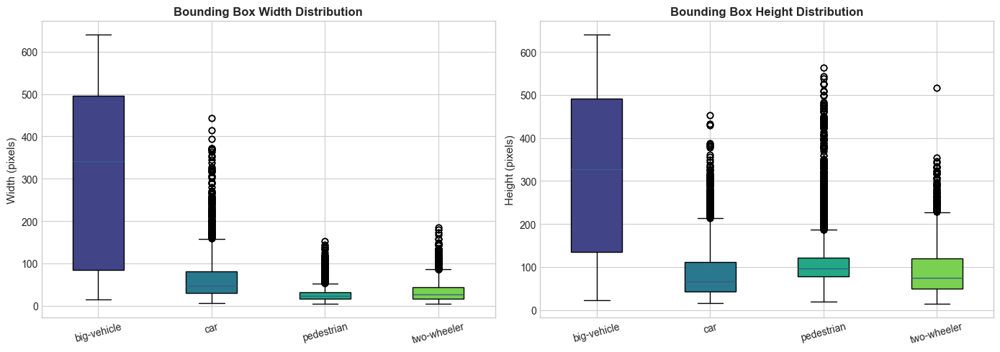

In [30]:
# =============================================
# BBOX SIZE DISTRIBUTION BOXPLOT
# =============================================

fig, axes = plt.subplots(1, 2, figsize=(14, 5))

# Prepare data for boxplot
width_data: list = []
height_data: list = []
labels: list = []

for class_id in range(NUM_CLASSES):
    if train_bbox_sizes[class_id]:
        width_data.append([s[0] for s in train_bbox_sizes[class_id]])
        height_data.append([s[1] for s in train_bbox_sizes[class_id]])
        labels.append(CLASS_NAMES[class_id])

# Width boxplot
bp1 = axes[0].boxplot(width_data, tick_labels=labels, patch_artist=True)
for patch, color in zip(bp1['boxes'], sns.color_palette('viridis', len(labels))):
    patch.set_facecolor(color)
axes[0].set_ylabel('Width (pixels)', fontsize=11)
axes[0].set_title('Bounding Box Width Distribution', fontsize=12, fontweight='bold')
axes[0].tick_params(axis='x', rotation=15)

# Height boxplot
bp2 = axes[1].boxplot(height_data, tick_labels=labels, patch_artist=True)
for patch, color in zip(bp2['boxes'], sns.color_palette('viridis', len(labels))):
    patch.set_facecolor(color)
axes[1].set_ylabel('Height (pixels)', fontsize=11)
axes[1].set_title('Bounding Box Height Distribution', fontsize=12, fontweight='bold')
axes[1].tick_params(axis='x', rotation=15)

plt.tight_layout()
plt.show()

### 2.4 Sample Images Visualization

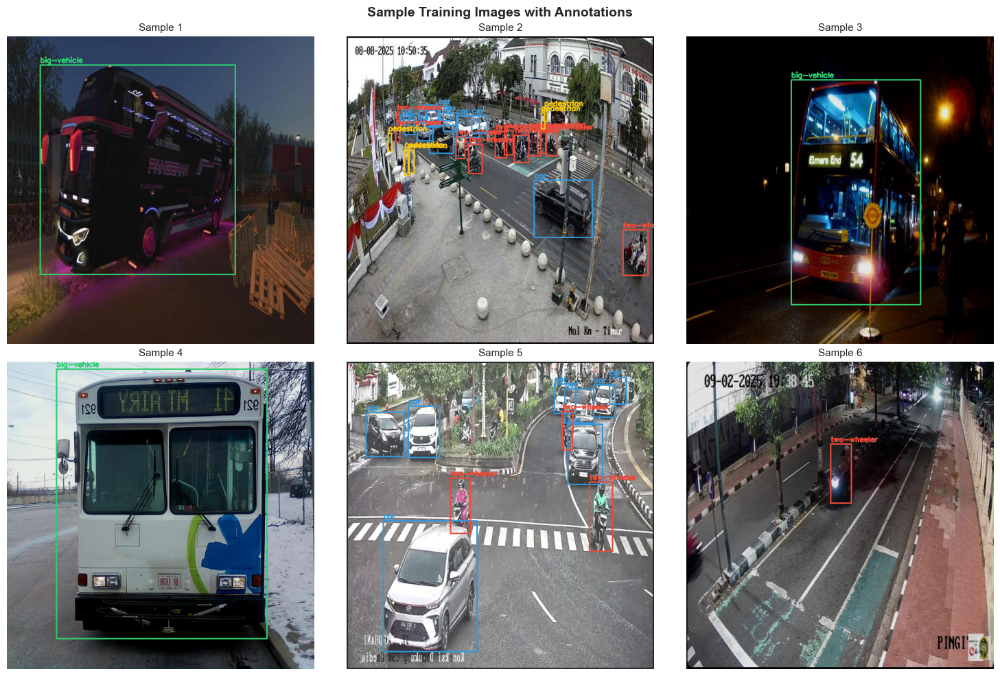

In [31]:
# =============================================
# SAMPLE IMAGES WITH ANNOTATIONS
# =============================================

def draw_annotations(img_path: Path, lbl_path: Path, class_names: list[str]) -> np.ndarray:
    """Draw bounding boxes on image."""
    img: np.ndarray = cv2.imread(str(img_path))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    h, w = img.shape[:2]
    
    # Color palette for classes
    colors: list[tuple] = [
        (46, 204, 113),   # green - big-vehicle
        (52, 152, 219),   # blue - car
        (241, 196, 15),   # yellow - pedestrian
        (231, 76, 60),    # red - two-wheeler
    ]
    
    if lbl_path.exists():
        with open(lbl_path, 'r') as f:
            for line in f:
                parts = line.strip().split()
                if len(parts) >= 5:
                    class_id: int = int(parts[0])
                    x_center: float = float(parts[1]) * w
                    y_center: float = float(parts[2]) * h
                    box_w: float = float(parts[3]) * w
                    box_h: float = float(parts[4]) * h
                    
                    x1: int = int(x_center - box_w / 2)
                    y1: int = int(y_center - box_h / 2)
                    x2: int = int(x_center + box_w / 2)
                    y2: int = int(y_center + box_h / 2)
                    
                    color: tuple = colors[class_id % len(colors)]
                    cv2.rectangle(img, (x1, y1), (x2, y2), color, 2)
                    
                    label: str = class_names[class_id] if class_id < len(class_names) else f"Class-{class_id}"
                    cv2.putText(img, label, (x1, y1 - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
    
    return img

# Sample 6 random images from training set
sample_images: list = random.sample(train_images, min(6, len(train_images)))

fig, axes = plt.subplots(2, 3, figsize=(15, 10))
axes = axes.flatten()

for idx, img_path in enumerate(sample_images):
    lbl_path: Path = TRAIN_LBL_DIR / (img_path.stem + ".txt")
    annotated_img: np.ndarray = draw_annotations(img_path, lbl_path, CLASS_NAMES)
    
    axes[idx].imshow(annotated_img)
    axes[idx].set_title(f"Sample {idx + 1}", fontsize=11)
    axes[idx].axis('off')

plt.suptitle('Sample Training Images with Annotations', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

### 2.5 EDA Summary

In [32]:
# =============================================
# EDA SUMMARY
# =============================================

print("\n" + "="*60)
print("EXPLORATORY DATA ANALYSIS SUMMARY")
print("="*60)

print(f"\n[Dataset Info]")
print(f"  - Total Images: {len(train_images) + len(valid_images) + len(test_images):,}")
print(f"  - Training: {len(train_images):,} ({len(train_images) / (len(train_images) + len(valid_images) + len(test_images)) * 100:.1f}%)")
print(f"  - Validation: {len(valid_images):,} ({len(valid_images) / (len(train_images) + len(valid_images) + len(test_images)) * 100:.1f}%)")
print(f"  - Test: {len(test_images):,} ({len(test_images) / (len(train_images) + len(valid_images) + len(test_images)) * 100:.1f}%)")
print(f"  - Image Size: 640x640 pixels")

print(f"\n[Class Distribution]")
total_annotations: int = sum(total_class_dist.values())
for class_id in range(NUM_CLASSES):
    count: int = total_class_dist.get(class_id, 0)
    pct: float = (count / total_annotations) * 100 if total_annotations > 0 else 0
    print(f"  - {CLASS_NAMES[class_id]}: {count:,} ({pct:.1f}%)")

print(f"  - Total Annotations: {total_annotations:,}")

print(f"\n[Class Balance Analysis]")
if total_class_dist:
    max_count: int = max(total_class_dist.values())
    min_count: int = min(total_class_dist.values())
    imbalance_ratio: float = max_count / min_count if min_count > 0 else float('inf')
    print(f"  - Max/Min Ratio: {imbalance_ratio:.2f}x")
    if imbalance_ratio > 5:
        print("  - WARNING: Significant class imbalance detected!")
        print("  - Consider using class weights or data augmentation.")
    else:
        print("  - Dataset is relatively balanced.")

print("\n" + "="*60)


EXPLORATORY DATA ANALYSIS SUMMARY

[Dataset Info]
  - Total Images: 8,992
  - Training: 8,429 (93.7%)
  - Validation: 427 (4.7%)
  - Test: 136 (1.5%)
  - Image Size: 640x640 pixels

[Class Distribution]
  - big-vehicle: 6,893 (11.1%)
  - car: 14,804 (23.8%)
  - pedestrian: 19,782 (31.8%)
  - two-wheeler: 20,664 (33.3%)
  - Total Annotations: 62,143

[Class Balance Analysis]
  - Max/Min Ratio: 3.00x
  - Dataset is relatively balanced.



---
## 3. Model Training

### 3.1 Training Configuration

In [ ]:
# =============================================
# TRAINING HYPERPARAMETERS
# =============================================

# Model Selection (choose one)
# - "yolo11n.pt" : Nano (fastest, least accurate)
# - "yolo11s.pt" : Small
# - "yolo11m.pt" : Medium
# - "yolo11l.pt" : Large
# - "yolo11x.pt" : Extra Large (slowest, most accurate)

MODEL_VARIANT: str = "yolo11m.pt"  # Start with small for faster experiments

# Training Parameters
EPOCHS: int = 200
BATCH_SIZE: int = 16  # Adjust based on GPU memory
IMAGE_SIZE: int = 640
PATIENCE: int = 20   # Early stopping patience

# Output directory
PROJECT_NAME: str = "traffic_detection"
RUN_NAME: str = "yolo11m_200epochs"

print("Training Configuration:")
print(f"  - Base Model: {MODEL_VARIANT}")
print(f"  - Epochs: {EPOCHS}")
print(f"  - Batch Size: {BATCH_SIZE}")
print(f"  - Image Size: {IMAGE_SIZE}")
print(f"  - Early Stopping: {PATIENCE} epochs")
print(f"  - Device: {DEVICE} ({'GPU' if DEVICE == 0 else 'CPU'})")

Training Configuration:
  - Base Model: yolo11m.pt
  - Epochs: 200
  - Batch Size: 16
  - Image Size: 640
  - Early Stopping: 20 epochs
  - Device: 0 (GPU)


### 3.2 Start Training

In [34]:
# =============================================
# MODEL TRAINING (USING NVIDIA GPU)
# =============================================

# Load pretrained model
model: YOLO = YOLO(MODEL_VARIANT)

# Start training with GPU
results = model.train(
    data=DATA_YAML,
    epochs=EPOCHS,
    imgsz=IMAGE_SIZE,
    batch=BATCH_SIZE,
    patience=PATIENCE,
    device=DEVICE,  # Use NVIDIA GPU (0) or CPU
    project=PROJECT_NAME,
    name=RUN_NAME,
    save=True,
    save_period=10,  # Save checkpoint every 10 epochs
    plots=True,
    verbose=True
)

print("\nTraining completed!")

Ultralytics 8.4.13  Python-3.11.9 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 8188MiB)
engine\trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=16, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=traffic-merged.v2-traffic-day-night.yolov12\data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, end2end=None, epochs=200, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=yolo11m.pt, momentum=0.937, mosaic=1.0, multi_scale=0.0, name=yolo11m_200epochs, nbs=64, nms=False, opset=None, optimize=False, optimizer=au

---
## 4. Evaluation & Results

In [37]:
# =============================================
# MODEL VALIDATION
# =============================================

# Load best model
# NOTE: Adjust the suffix (e.g., '5', '6') if your run folder is different
best_model_path: str = f"runs/detect/{PROJECT_NAME}/{RUN_NAME}/weights/best.pt"
print(f"Loading best model from: {best_model_path}")

trained_model: YOLO = YOLO(best_model_path)

# Validate on validation set
val_results = trained_model.val(data=DATA_YAML, device=DEVICE)

print("\n=== Validation Results ===")
print(f"mAP@50:    {val_results.box.map50:.4f}")
print(f"mAP@50-95: {val_results.box.map:.4f}")

Loading best model from: runs/detect/traffic_detection/yolo11m_200epochs/weights/best.pt
Ultralytics 8.4.13  Python-3.11.9 torch-2.5.1+cu121 CUDA:0 (NVIDIA GeForce RTX 4060 Ti, 8188MiB)
YOLO11m summary (fused): 126 layers, 20,033,116 parameters, 0 gradients, 67.7 GFLOPs
val: Fast image access  (ping: 0.00.0 ms, read: 1208.0453.6 MB/s, size: 74.0 KB)
val: Scanning D:\ML\traffic-detection\nfl\traffic-counter-cctv\traffic-merged.v2-traffic-day-night.yolov12\valid\labels.cache... 427 images, 0 backgrounds, 0 corrupt: 100% ━━━━━━━━━━━━ 427/427  0.0s
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100% ━━━━━━━━━━━━ 27/27 4.0it/s 6.7s0.2s
                   all        427       3118      0.931      0.922      0.964      0.858
           big-vehicle        288        379      0.953      0.918      0.976      0.919
                   car        167        720      0.915      0.927      0.958      0.876
            pedestrian        145        993      0

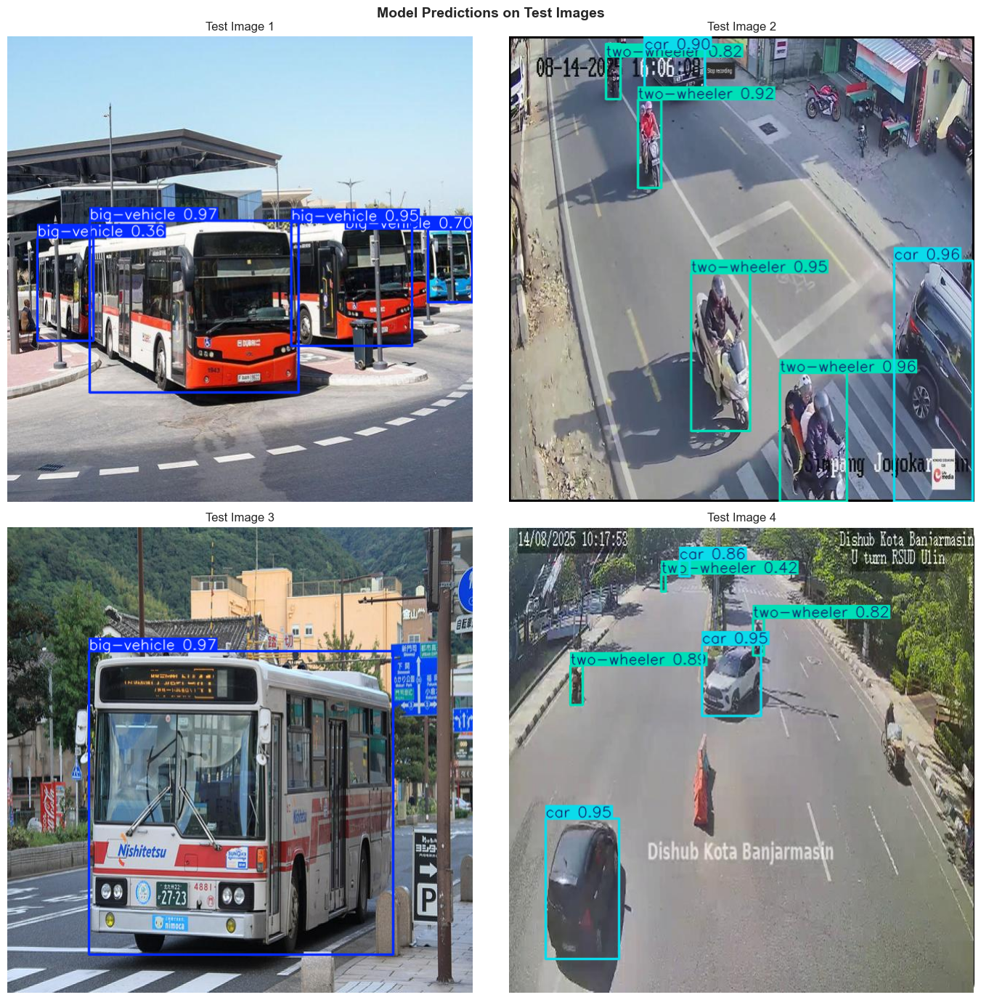

In [38]:
# =============================================
# INFERENCE ON TEST IMAGES
# =============================================

# Sample 4 test images
sample_test_images: list = random.sample(test_images, min(4, len(test_images)))

fig, axes = plt.subplots(2, 2, figsize=(14, 14))
axes = axes.flatten()

for idx, img_path in enumerate(sample_test_images):
    # Run inference
    results = trained_model.predict(str(img_path), conf=0.3, device=DEVICE, verbose=False)
    
    # Get annotated image
    annotated_img: np.ndarray = results[0].plot()
    annotated_img = cv2.cvtColor(annotated_img, cv2.COLOR_BGR2RGB)
    
    axes[idx].imshow(annotated_img)
    axes[idx].set_title(f"Test Image {idx + 1}", fontsize=12)
    axes[idx].axis('off')

plt.suptitle('Model Predictions on Test Images', fontsize=14, fontweight='bold')
plt.tight_layout()
plt.show()

In [39]:
# =============================================
# EXPORT MODEL
# =============================================

# Export to ONNX format for deployment
print("Exporting model to ONNX format...")

# Gunakan simplify=False untuk menghindari percobaan install onnxslim yang butuh admin
trained_model.export(format='onnx', simplify=False)

print(f"\nModel exported successfully!")
print(f"Best weights: {best_model_path}")
print(f"ONNX model: {best_model_path.replace('.pt', '.onnx')}")

Exporting model to ONNX format...
Ultralytics 8.4.13  Python-3.11.9 torch-2.5.1+cu121 CPU (13th Gen Intel Core(TM) i5-13400F)

PyTorch: starting from 'runs\detect\traffic_detection\yolo11m_200epochs\weights\best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 8, 8400) (38.7 MB)

ONNX: starting export with onnx 1.20.1 opset 19...
ONNX: export success  1.5s, saved as 'runs\detect\traffic_detection\yolo11m_200epochs\weights\best.onnx' (76.7 MB)

Export complete (2.2s)
Results saved to D:\ML\traffic-detection\nfl\traffic-counter-cctv\runs\detect\traffic_detection\yolo11m_200epochs\weights
Predict:         yolo predict task=detect model=runs\detect\traffic_detection\yolo11m_200epochs\weights\best.onnx imgsz=640 
Validate:        yolo val task=detect model=runs\detect\traffic_detection\yolo11m_200epochs\weights\best.onnx imgsz=640 data=traffic-merged.v2-traffic-day-night.yolov12\data.yaml  
Visualize:       https://netron.app

Model exported successfully!
Best weights: run

---
## 5. Summary

### Training Complete!

**What was done:**
1. Loaded and analyzed the traffic-merged dataset (v2)
2. Performed EDA on class distribution and bbox sizes
3. Trained YOLO model on the dataset using NVIDIA GPU
4. Validated and tested the model
5. Exported to ONNX for deployment

**Next Steps:**
- Use the trained model in `youtube_livestream.py` by updating `MODEL_ID`
- Fine-tune hyperparameters if needed
- Deploy to edge devices using ONNX runtime